# Project 2

### Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import skew, shapiro

from sklearn import metrics
from sklearn.linear_model import LinearRegression, Ridge, Lasso, RidgeCV, LassoCV
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PowerTransformer

from dython.nominal import identify_nominal_columns
from dython.nominal import associations

%config InlineBackend.figure_format = 'retina'

### Import Datasets

In [2]:
train_clean = pd.read_csv('../datasets/train_pop_NaN.csv')
test_clean = pd.read_csv('../datasets/test_pop_NaN.csv')

C:\Users\enoch\AppData\Local\Temp\ipykernel_21984\914542660.py:1: DtypeWarning: Columns (42) have mixed types. Specify dtype option on import or set low_memory=False.
  train_clean = pd.read_csv('../datasets/train_pop_NaN.csv')
C:\Users\enoch\AppData\Local\Temp\ipykernel_21984\914542660.py:2: DtypeWarning: Columns (41) have mixed types. Specify dtype option on import or set low_memory=False.
  test_clean = pd.read_csv('../datasets/test_pop_NaN.csv')


## Data Dictionary

|Feature|Type|Dataset|Description|
|---|---|---|---|
|**id**|*integer*|train_clean|unique id for each transaction|
|**tranc_yearmonth**|*string*|train_clean|year and month of the resale transaction, e.g. 2015-02|
|**town**|*string*|train_clean|HDB township where the flat is located, e.g. BUKIT MERAH|
|**flat_type**|*string*|train_clean|type of the resale flat unit, e.g. 3 ROOM|
|**block**|*string*|train_clean|block number of the resale flat, e.g. 454|
|**street_name**|*string*|train_clean|street name where the resale flat resides, e.g. TAMPINES ST 42|
|**storey_range**|*string*|train_clean|floor level (range) of the resale flat unit, e.g. 07 TO 09|
|**floor_area_sqm**|*float*|train_clean|floor area of the resale flat unit in square metres|
|**flat_model**|*string*|train_clean|HDB model of the resale flat, e.g. Multi Generation|
|**lease_commence_date**|*integer*|train_clean|commencement year of the flat unit's 99-year lease|
|**resale_price**|*float*|train_clean|the property's sale price in Singapore dollars|
|**tranc_year**|*integer*|train_clean|year of resale transaction|
|**tranc_month**|*integer*|train_clean|month of resale transaction|
|**mid_storey**|*integer*|train_clean|median value of storey_range|
|**lower**|*integer*|train_clean|lower value of storey_range|
|**upper**|*integer*|train_clean|upper value of storey_range|
|**mid**|*integer*|train_clean|middle value of storey_range|
|**full_flat_type**|*string*|train_clean|combination of flat_type and flat_model|
|**address**|*string*|train_clean|combination of block and street_name|
|**floor_area_sqft**|*float*|train_clean|floor area of the resale flat unit in square feet|
|**price_per_sqft**|*float*|train_clean|the property's price per square feet in Singapore dollars|
|**hdb_age**|*integer*|train_clean|number of years from lease_commence_date to present year|
|**max_floor_lvl**|*integer*|train_clean|highest floor of the resale flat|
|**year_completed**|*integer*|train_clean|year which construction was completed for resale flat|
|**residential**|*string*|train_clean|boolean value if resale flat has residential units in the same block|
|**commercial**|*string*|train_clean|boolean value if resale flat has commercial units in the same block|
|**market_hawker**|*string*|train_clean|boolean value if resale flat has a market or hawker centre in the same block|
|**multistorey_carpark**|*string*|train_clean|boolean value if resale flat has a multistorey carpark in the same block|
|**precinct_pavilion**|*string*|train_clean|boolean value if resale flat has a pavilion in the same block|
|**total_dwelling_units**|*integer*|train_clean|total number of residential dwelling units in the resale flat|
|**1room_sold**|*integer*|train_clean|number of 1-room residential units in the resale flat|
|**2room_sold**|*integer*|train_clean|number of 2-room residential units in the resale flat|
|**3room_sold**|*integer*|train_clean|number of 3-room residential units in the resale flat|
|**4room_sold**|*integer*|train_clean|number of 4-room residential units in the resale flat|
|**5room_sold**|*integer*|train_clean|number of 5-room residential units in the resale flat|
|**exec_sold**|*integer*|train_clean|number of executive type residential units in the resale flat block|
|**multigen_sold**|*integer*|train_clean|number of multi-generational type residential units in the resale flat block|
|**studio_apartment_sold**|*integer*|train_clean|number of studio apartment type residential units in the resale flat block|
|**1room_rental**|*integer*|train_clean|number of 1-room rental residential units in the resale flat block|
|**2room_rental**|*integer*|train_clean|number of 2-room rental residential units in the resale flat block|
|**3room_rental**|*integer*|train_clean|number of 3-room rental residential units in the resale flat block|
|**other_room_rental**|*integer*|train_clean|number of "other" type rental residential units in the resale flat block|
|**postal**|*string*|train_clean|postal code of the resale flat block|
|**latitude**|*float*|train_clean|Latitude based on postal code|
|**longitude**|*float*|train_clean|Longitude based on postal code|
|**planning_area**|*string*|train_clean|Government planning area that the flat is located|
|**mall_nearest_distance**|*float*|train_clean|distance (in metres) to the nearest mall|
|**mall_within_500m**|*float*|train_clean|number of malls within 500 metres|
|**mall_within_1km**|*float*|train_clean|number of malls within 1 kilometre|
|**mall_within_2km**|*float*|train_clean|number of malls within 2 kilometre|
|**hawker_nearest_distance**|*float*|train_clean|distance (in metres) to the nearest hawker centre|
|**hawker_within_500m**|*float*|train_clean|number of hawker centres within 500 metres|
|**hawker_within_1km**|*float*|train_clean|number of hawker centres within 1 kilometre|
|**hawker_within_2km**|*float*|train_clean|number of hawker centres within 2 kilometre|
|**hawker_food_stalls**|*integer*|train_clean|number of hawker food stalls in the nearest hawker centre|
|**hawker_market_stalls**|*integer*|train_clean|number of hawker and market stalls in the nearest hawker centre|
|**mrt_nearest_distance**|*float*|train_clean|distance (in metres) to the nearest MRT station|
|**mrt_name**|*string*|train_clean|name of the nearest MRT station|
|**bus_interchange**|*integer*|train_clean|boolean value if the nearest MRT station is also a bus interchange|
|**mrt_interchange**|*integer*|train_clean|boolean value if the nearest MRT station is a train interchange station|
|**mrt_latitude**|*float*|train_clean|latitude (in decimal degrees) of the the nearest MRT station|
|**mrt_longitude**|*float*|train_clean|longitude (in decimal degrees) of the nearest MRT station|
|**bus_stop_nearest_distance**|*float*|train_clean|distance (in metres) to the nearest bus stop|
|**bus_stop_name**|*string*|train_clean|name of the nearest bus stop|
|**bus_stop_latitude**|*float*|train_clean|latitude (in decimal degrees) of the the nearest bus stop|
|**bus_stop_longitude**|*float*|train_clean|longitude (in decimal degrees) of the nearest bus stop|
|**pri_sch_nearest_distance**|*float*|train_clean|distance (in metres) to the nearest primary school|
|**pri_sch_name**|*string*|train_clean|name of the nearest primary school|
|**vacancy**|*integer*|train_clean|number of vacancies in the nearest primary school|
|**pri_sch_affiliation**|*integer*|train_clean|boolean value if the nearest primary school has a secondary school affiliation|
|**pri_sch_latitude**|*float*|train_clean|latitude (in decimal degrees) of the the nearest primary school|
|**pri_sch_longitude**|*float*|train_clean|longitude (in decimal degrees) of the nearest primary school|
|**sec_sch_nearest_dist**|*float*|train_clean|distance (in metres) to the nearest secondary school|
|**sec_sch_name**|*string*|train_clean|name of the nearest secondary school|
|**cutoff_point**|*integer*|train_clean|PSLE cutoff point of the nearest secondary school|
|**affiliation**|*integer*|train_clean|boolean value if the nearest secondary school has an primary school affiliation|
|**sec_sch_latitude**|*float*|train_clean|latitude (in decimal degrees) of the the nearest secondary school|
|**sec_sch_longitude**|*float*|train_clean|longitude (in decimal degrees) of the nearest secondary school|

### Heatmap before Dropping Redundant Columns

C:\Users\enoch\anaconda3\lib\site-packages\dython\nominal.py:298: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(
C:\Users\enoch\anaconda3\lib\site-packages\dython\nominal.py:298: RuntimeWarning: Rounded eta = 1.000000000000003 to 1. This is probably due to floating point precision issues.
  warnings.warn(
C:\Users\enoch\anaconda3\lib\site-packages\dython\nominal.py:298: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(
C:\Users\enoch\anaconda3\lib\site-packages\dython\nominal.py:298: RuntimeWarning: Rounded eta = 1.0000000000000002 to 1. This is probably due to floating point precision issues.
  warnings.warn(
C:\Users\enoch\anaconda3\lib\site-packages\dython\nominal.py:298: RuntimeWarning: Rounded eta = 1.0000000000000013 to 1. This is probably due to floating point precision issues.
  warnings.warn(
C:\Users\enoch\anaconda3\l

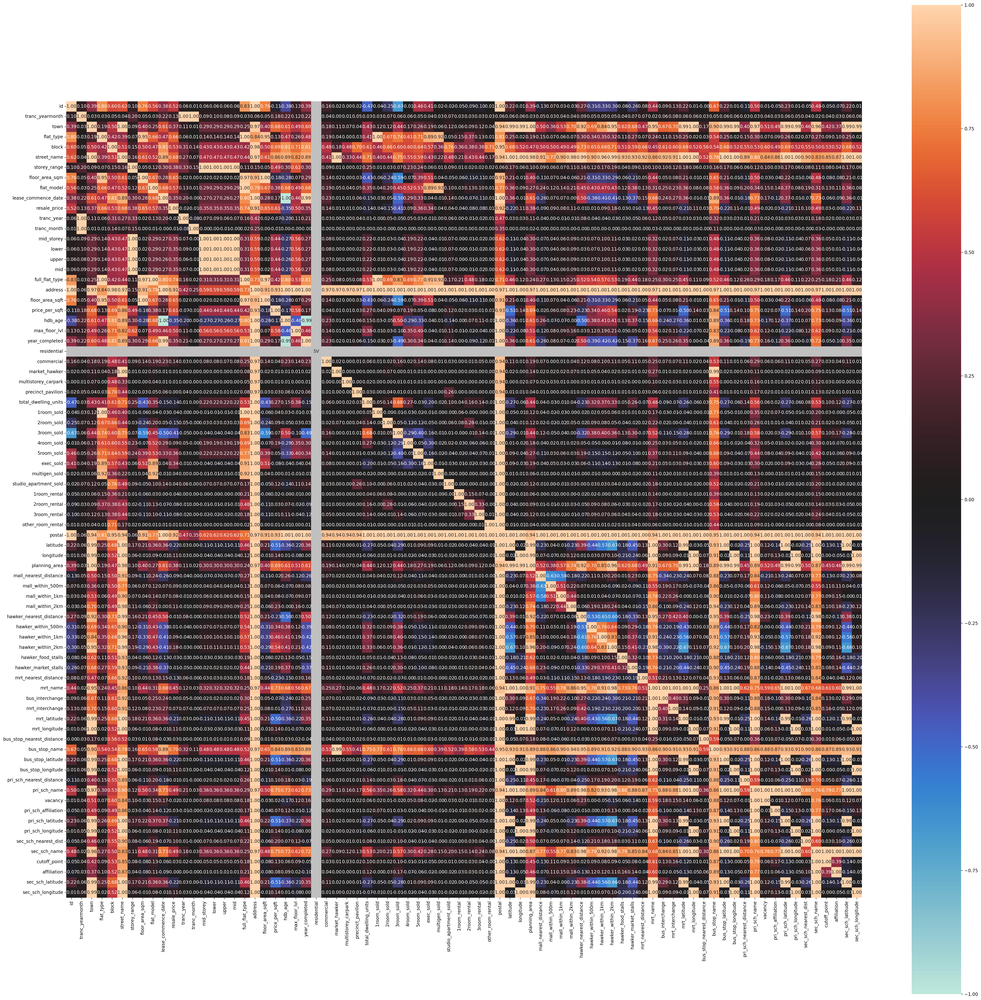

In [3]:
complete_correlation = associations(train_clean, figsize=(40,40))
# since data is stored as something akin to dictionary, with key being ['corr'], call key
df_complete_corr = complete_correlation['corr']
# style the table, drop NA, and precision of float
df_complete_corr.dropna(axis=1, how='all').dropna(axis=0, how='all').style.background_gradient(cmap='icefire', axis=None)

These columns are correlated/exhibit colinearity.
- mid, mid_storey, lower, upper are correlated (r=1)
- floor_area_sqm, floor_area_sqft are correlated (r=1)
- hdb_age, lease_commence_date, year_completed are correlated (r~=1)
- Hawker_Within_2km and Hawker_Within_1km (r = 0.83)

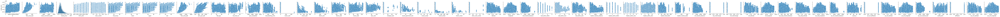

In [4]:
# Pairplot to visualize the correlation amongst numeric variables
sns.pairplot(data=train_clean, y_vars='resale_price')

We note that only `floor_area_sqm` have a strong linear relationship with `resale_price`

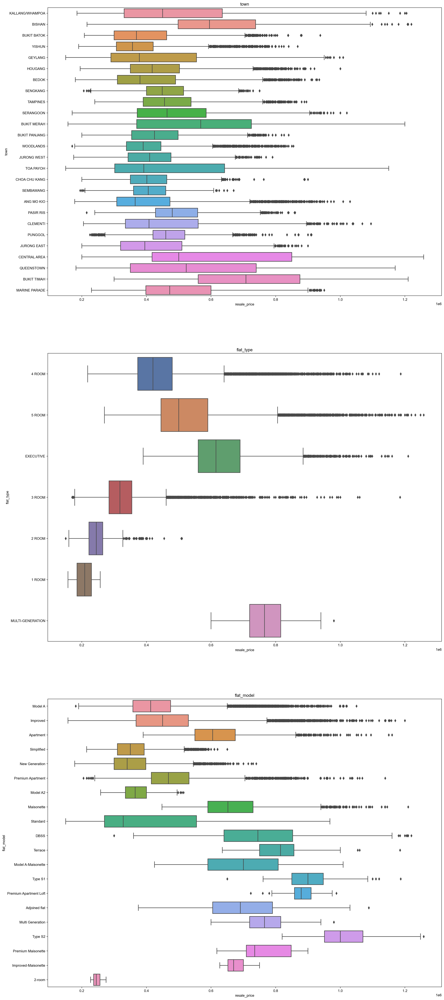

In [5]:
# Boxplots to visualize categorical variables
cat_col = ['town', 'flat_type', 'flat_model']
fig, axes = plt.subplots(3, 1, figsize=(20,50))
for i, col in enumerate(cat_col):
    sns.boxplot(data=train_clean, x='resale_price', y=col, ax=axes[i])
    sns.set_theme()
    axes[i].set_title(col)
plt.show()

### Select X Variables - 1st Round

The first round of X variables selection is based on our own existing Domain Knowledge.

We were interested to know if being in the vicinity of a top ranking Primary School or Secondary School would affect the `resale_price`.

In [6]:
# source: https://tutorcity.sg/blog/primary-school-ranking-2022
top_10_pri_sch = ["CHIJ Saint Nicholas Girls' School",'Rosyth School','Pei Hwa Presbyterian Primary School',
               'Nanyang Primary School','Catholic High School','Ai Tong School','Nan Hua Primary School',
                 'Red Swastika School','Tao Nan School','Temasek Primary School']

# source: https://schoolbell.sg/secondary-school-ranking/
# if you're wondering where NYGH and HCI is at, they aren't in the list of secondary schools
# same goes for any other top school you don't see on this list. It wasn't in the og set.
top_10_sec_sch = ["Raffles Girls' School",'Raffles Institution',"CHIJ Saint Nicholas Girls' School",
                 'Anglo-Chinese School',"Methodist Girls' School",'Dunman High School','Catholic High School',
                 "Cedar Girls' Secondary School",'River Valley High School']

train_clean['pri_sch_name'] = train_clean['pri_sch_name'].apply(lambda x: 1 if x in top_10_pri_sch else 0)
train_clean['sec_sch_name'] = train_clean['sec_sch_name'].apply(lambda x: 1 if x in top_10_sec_sch else 0)

In [7]:
lst_sel_cols = ['town','flat_type', 'mid', 'floor_area_sqm', 'flat_model', 'resale_price',
                'tranc_year', 'tranc_month', 'hdb_age', 'max_floor_lvl', 'commercial', 'market_hawker', 
                'multistorey_carpark', 'precinct_pavilion', 'total_dwelling_units', '1room_sold', '2room_sold',
                '3room_sold', '4room_sold', '5room_sold', 'exec_sold', 'multigen_sold', 'studio_apartment_sold', 
                '1room_rental', '2room_rental', '3room_rental', 'other_room_rental', 'mall_nearest_distance', 
                'mall_within_2km', 'hawker_nearest_distance', 'hawker_within_2km', 'hawker_food_stalls', 
                'hawker_market_stalls', 'mrt_nearest_distance', 'bus_interchange', 'mrt_interchange', 
                'bus_stop_nearest_distance', 'pri_sch_nearest_distance', 'pri_sch_name', 'vacancy', 
                'pri_sch_affiliation', 'sec_sch_nearest_dist', 'sec_sch_name', 'cutoff_point', 'affiliation']
train_clean_sel = train_clean[lst_sel_cols]

### Dummify Variables

In [8]:
df_dummies=pd.get_dummies(train_clean_sel, drop_first=True)

### X and y Variables

In [9]:
X = df_dummies.drop('resale_price',axis=1)
y = train_clean['resale_price']

### Model Prep: Train/test split

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, train_size=0.85)

### Model Prep: StandardScaler

In [11]:
ss = StandardScaler()
ss.fit(X_train)
X_train_sc = ss.transform(X_train)
X_test_sc = ss.transform(X_test)

### Linear Regression (StandardScaler)

In [12]:
# Create an instance of linear regression
lr = LinearRegression()

In [13]:
# Cross Val Score 
print(f'Cross-Validation Score on training set: {cross_val_score(lr, X_train_sc, y_train, cv=8).mean()}')
print(f'Cross-Validation Score on testing set: {cross_val_score(lr, X_test_sc, y_test, cv=8).mean()}')

Cross-Validation Score on training set: 0.8890507135523971
Cross-Validation Score on testing set: 0.8896219072288079


In [14]:
# Fit model instance on train data
lr.fit(X_train_sc, y_train)

LinearRegression()

In [15]:
# R-Squared - how well the predictor variables can explain the variation in the response variable 
print(f'R^2 on training set: {lr.score(X_train_sc, y_train)}')
print(f'R^2 on testing set: {lr.score(X_test_sc, y_test)}')

R^2 on training set: 0.8892766246610098
R^2 on testing set: 0.8902045559031537


In [16]:
# MSE - the lower the value the better and 0 means the model is perfect
print(f'MSE on training set: {metrics.mean_squared_error(y_train, (lr.predict(X_train_sc)))}')
print(f'MSE on testing set: {metrics.mean_squared_error(y_test, (lr.predict(X_test_sc)))}')

MSE on training set: 2277878435.4261694
MSE on testing set: 2232462670.183351


In [17]:
# RMSE - how well a regression model can predict the value of a response variable in absolute terms 
# closer to 0 the better
print(f'RMSE on training set: {metrics.mean_squared_error(y_train, (lr.predict(X_train_sc)), squared=False)}')
print(f'RMSE on testing set: {metrics.mean_squared_error(y_test, (lr.predict(X_test_sc)), squared=False)}')
print(f'RMSE (on training set) over mean y value: {metrics.mean_squared_error(y_train, (lr.predict(X_train_sc)), squared=False)/train_clean["resale_price"].mean()}')
print(f'RMSE (on testing set) over mean y value: {metrics.mean_squared_error(y_test, (lr.predict(X_test_sc)), squared=False)/train_clean["resale_price"].mean()}')

RMSE on training set: 47727.124734538214
RMSE on testing set: 47248.943588014234
RMSE (on training set) over mean y value: 0.10625827148061272
RMSE (on testing set) over mean y value: 0.10519366299294729


                          Column_Name  Coefficient_Value
64                   flat_type_4 ROOM      -4.914002e+15
63                   flat_type_3 ROOM      -4.387482e+15
65                   flat_type_5 ROOM      -4.290169e+15
66                flat_type_EXECUTIVE      -2.711845e+15
6                total_dwelling_units      -2.660356e+15
62                   flat_type_2 ROOM      -1.109945e+15
77        flat_model_Multi Generation      -1.108132e+14
67         flat_type_MULTI-GENERATION      -9.280927e+13
4                             hdb_age      -4.780815e+04
25               mrt_nearest_distance      -2.462043e+04
60                     town_WOODLANDS      -2.316733e+04
2                          tranc_year      -1.679004e+04
49                   town_JURONG WEST      -1.584353e+04
55                     town_SEMBAWANG      -1.486322e+04
21            hawker_nearest_distance      -1.438571e+04
74                 flat_model_Model A      -1.355362e+04
71                flat_model_Im

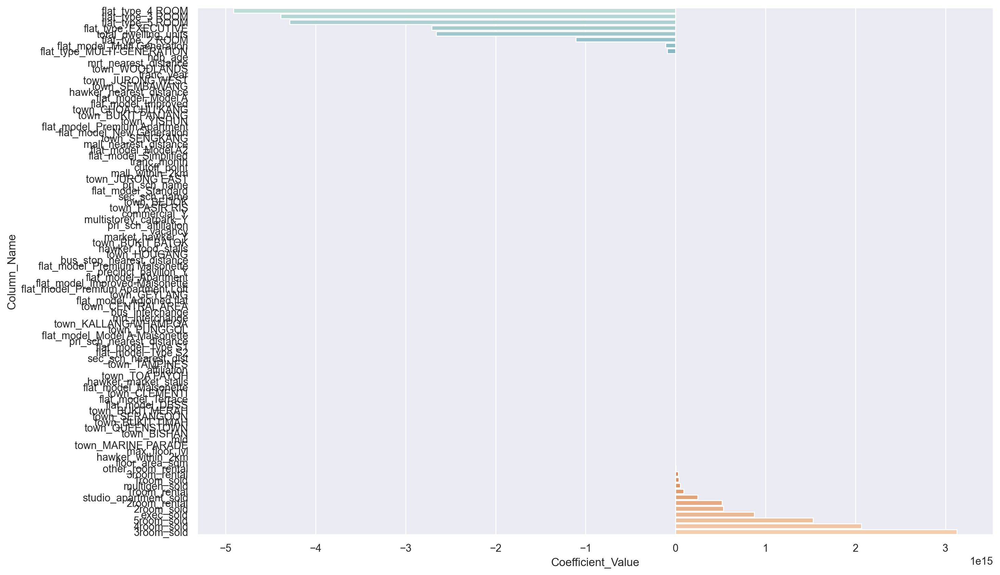

In [18]:
# Create df for storing coefficients and their corresponding variable names
coefficient_df = pd.DataFrame()

# Storing all the column names of predictors
coefficient_df['Column_Name'] = X_train.columns

# Store coefficients of predictors
coefficient_df['Coefficient_Value'] = pd.Series(lr.coef_) # this will differ for different models

# Preview variables' coefficient values - The higher the values, the stronger the variables
with pd.option_context('display.max_rows', None):
    print(coefficient_df.sort_values(by='Coefficient_Value'))

# Plot the coefficent values
# Goal is to tune the model so that we get a more stable model i.e. similar size coefficient values
plt.rcParams['figure.figsize'] = (15,10)
sns.barplot(data=coefficient_df.sort_values(by='Coefficient_Value'), x='Coefficient_Value',y='Column_Name',orient='h',palette='icefire')
None

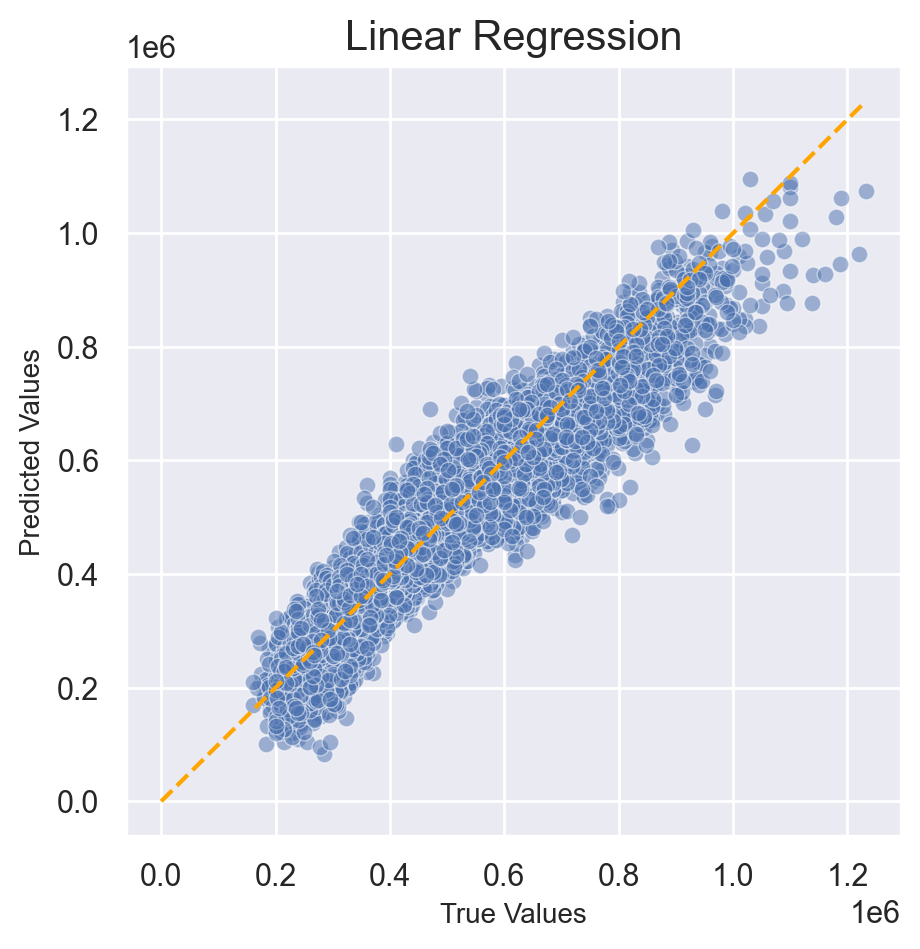

In [19]:
preds=lr.predict(X_test_sc)
plt.figure(figsize = (5, 5))

# Examine the relationship between observed and predicted values.
sns.scatterplot(x=y_test, y=preds,alpha=0.5)
sns.set_theme()

# Line showing perfect predictions.
plt.plot([0, max(max(y_test),max(preds))],
         [0, max(max(y_test),max(preds))],
         linestyle = '--',color='orange')

plt.title('Linear Regression', fontsize = 15)
plt.xlabel('True Values', fontsize = 10)
plt.ylabel('Predicted Values', fontsize = 10);

### Ridge (StandardScaler)

In [20]:
%%time
ridge_alphas = np.logspace(0, 5, 200)

optimal_ridge = RidgeCV(alphas=ridge_alphas, cv=5)
optimal_ridge.fit(X_train_sc, y_train)

print (optimal_ridge.alpha_)

18.041864093920726
Wall time: 3min 40s


In [21]:
ridge = Ridge(alpha=optimal_ridge.alpha_)

In [22]:
# Cross Val Score 
print(f'Cross-Validation Score on training set: {cross_val_score(ridge, X_train_sc, y_train, cv=3).mean()}')
print(f'Cross-Validation Score on testing set: {cross_val_score(ridge, X_test_sc, y_test, cv=3).mean()}')

Cross-Validation Score on training set: 0.8890289044919002
Cross-Validation Score on testing set: 0.8897071650074043


In [23]:
# R-Squared - how well the predictor variables can explain the variation in the response variable 
# above 0.7 generally seen as high correlation, below 0.4 would show a low correlation
print(f'R^2 on training set: {optimal_ridge.score(X_train_sc, y_train)}')
print(f'R^2 on testing set: {optimal_ridge.score(X_test_sc, y_test)}')

R^2 on training set: 0.8892762397906643
R^2 on testing set: 0.8902026488715511


In [24]:
# MSE - the lower the value the better and 0 means the model is perfect
print(f'MSE on training set: {metrics.mean_squared_error(y_train, (optimal_ridge.predict(X_train_sc)))}')
print(f'MSE on testing set: {metrics.mean_squared_error(y_test, (optimal_ridge.predict(X_test_sc)))}')

MSE on training set: 2277886353.2471156
MSE on testing set: 2232501445.7163315


In [25]:
# RMSE - how well a regression model can predict the value of a response variable in absolute terms 
# closer to 0 the better
print(f'RMSE on training set: {metrics.mean_squared_error(y_train, (optimal_ridge.predict(X_train_sc)), squared=False)}')
print(f'RMSE on testing set: {metrics.mean_squared_error(y_test, (optimal_ridge.predict(X_test_sc)), squared=False)}')
print(f'RMSE (on training set) over mean y value: {metrics.mean_squared_error(y_train, (optimal_ridge.predict(X_train_sc)), squared=False)/train_clean["resale_price"].mean()}')
print(f'RMSE (on testing set) over mean y value: {metrics.mean_squared_error(y_test, (optimal_ridge.predict(X_test_sc)), squared=False)/train_clean["resale_price"].mean()}')

RMSE on training set: 47727.20768332373
RMSE on testing set: 47249.35391850699
RMSE (on training set) over mean y value: 0.1062584561553573
RMSE (on testing set) over mean y value: 0.10519457654072831


                          Column_Name  Coefficient_Value
4                             hdb_age      -47751.371206
25               mrt_nearest_distance      -24614.471326
60                     town_WOODLANDS      -23138.179223
2                          tranc_year      -16785.250039
49                   town_JURONG WEST      -15831.600797
55                     town_SEMBAWANG      -14856.266091
21            hawker_nearest_distance      -14372.887332
44                 town_CHOA CHU KANG      -11875.571866
41                 town_BUKIT PANJANG      -10918.245952
61                        town_YISHUN       -7574.840942
74                 flat_model_Model A       -7379.994921
63                   flat_type_3 ROOM       -6773.647761
71                flat_model_Improved       -6584.110625
6                total_dwelling_units       -6092.156108
12                          exec_sold       -5401.866422
56                      town_SENGKANG       -4797.972160
19              mall_nearest_di

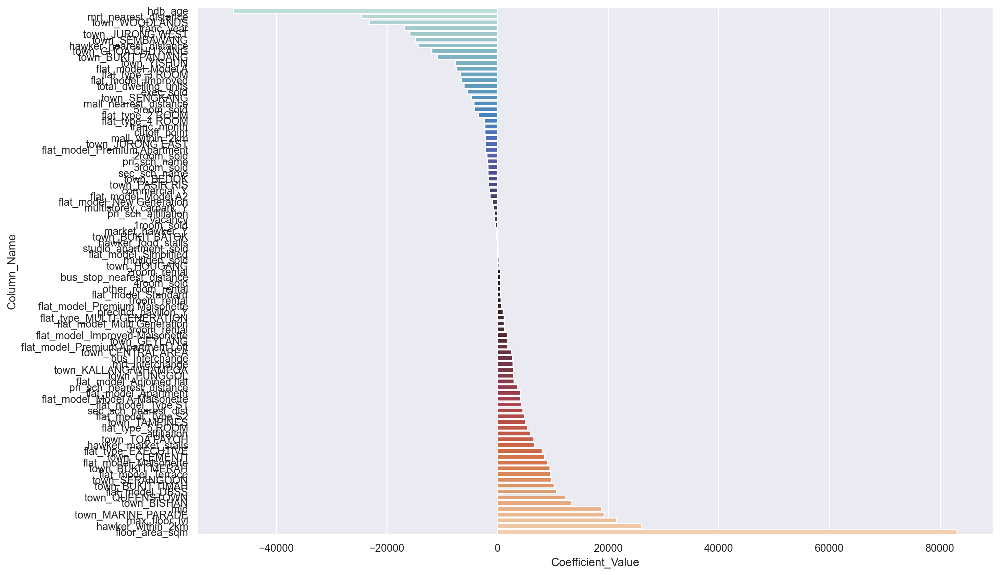

In [26]:
# Create df for storing coefficients and their corresponding variable names
coefficient_df = pd.DataFrame()

# Storing all the column names of predictors
coefficient_df['Column_Name'] = X_train.columns

# Store coefficients of predictors
coefficient_df['Coefficient_Value'] = pd.Series(optimal_ridge.coef_) # this will differ for different models

# Preview variables' coefficient values - The higher the values, the stronger the variables
with pd.option_context('display.max_rows', None):
    print(coefficient_df.sort_values(by='Coefficient_Value'))

# Plot the coefficent values
# Goal is to tune the model so that we get a more stable model i.e. similar size coefficient values
plt.rcParams['figure.figsize'] = (15,10)
sns.barplot(data=coefficient_df.sort_values(by='Coefficient_Value'), x='Coefficient_Value',y='Column_Name',orient='h',palette='icefire')
None

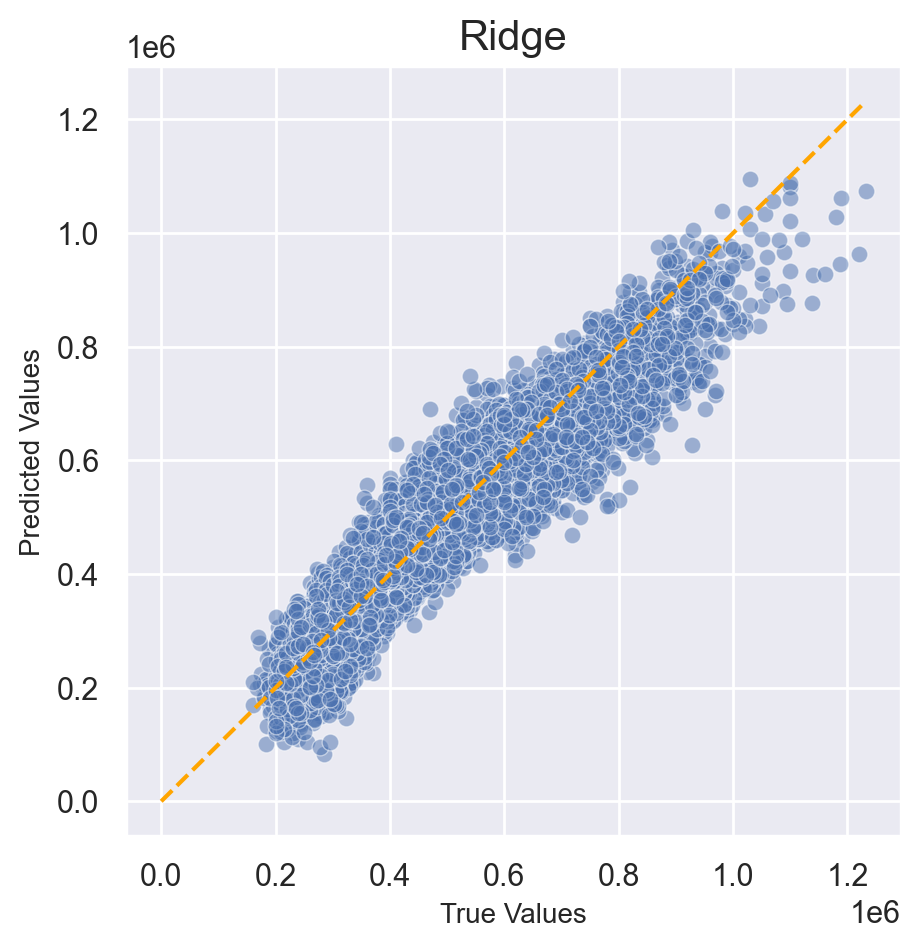

In [27]:
preds=optimal_ridge.predict(X_test_sc)
plt.figure(figsize = (5, 5))

# Examine the relationship between observed and predicted values.
sns.scatterplot(x=y_test, y=preds,alpha=0.5)
sns.set_theme()

# Line showing perfect predictions.
plt.plot([0, max(max(y_test),max(preds))],
         [0, max(max(y_test),max(preds))],
         linestyle = '--',color='orange')

plt.title('Ridge', fontsize = 15)
plt.xlabel('True Values', fontsize = 10)
plt.ylabel('Predicted Values', fontsize = 10);

### Lasso (StandardScaler)

In [28]:
# Test out 200 different alpha values on default 5-folds of data set and adopt the best performing alpha
optimal_lasso = LassoCV(n_alphas=200, cv=5)
# model fitting
optimal_lasso.fit(X_train_sc, y_train)

LassoCV(cv=5, n_alphas=200)

In [29]:
lasso = Lasso(alpha=optimal_lasso.alpha_)

In [30]:
# Cross Val Score 
print(f'Cross-Validation Score on training set: {cross_val_score(lasso, X_train_sc, y_train, cv=5).mean()}')
print(f'Cross-Validation Score on testing set: {cross_val_score(lasso, X_test_sc, y_test, cv=5).mean()}')

Cross-Validation Score on training set: 0.8889395964758299
Cross-Validation Score on testing set: 0.8896664845445699


In [31]:
# R-Squared - how well the predictor variables can explain the variation in the response variable 
# above 0.7 generally seen as high correlation, below 0.4 would show a low correlation
print(f'R^2 on training set: {optimal_lasso.score(X_train_sc, y_train)}')
print(f'R^2 on testing set: {optimal_lasso.score(X_test_sc, y_test)}')

R^2 on training set: 0.8891936405267614
R^2 on testing set: 0.8900923813453574


In [32]:
# MSE - the lower the value the better and 0 means the model is perfect
print(f'MSE on training set: {metrics.mean_squared_error(y_train, (optimal_lasso.predict(X_train_sc)))}')
print(f'MSE on testing set: {metrics.mean_squared_error(y_test, (optimal_lasso.predict(X_test_sc)))}')

MSE on training set: 2279585642.863698
MSE on testing set: 2234743507.1969867


In [33]:
# RMSE - how well a regression model can predict the value of a response variable in absolute terms 
# closer to 0 the better
print(f'RMSE on training set: {metrics.mean_squared_error(y_train, (optimal_lasso.predict(X_train_sc)), squared=False)}')
print(f'RMSE on testing set: {metrics.mean_squared_error(y_test, (optimal_lasso.predict(X_test_sc)), squared=False)}')
print(f'RMSE (on training set) over mean y value: {metrics.mean_squared_error(y_train, (optimal_lasso.predict(X_train_sc)), squared=False)/train_clean["resale_price"].mean()}')
print(f'RMSE (on testing set) over mean y value: {metrics.mean_squared_error(y_test, (optimal_lasso.predict(X_test_sc)), squared=False)/train_clean["resale_price"].mean()}')

RMSE on training set: 47745.00647045404
RMSE on testing set: 47273.073807369314
RMSE (on training set) over mean y value: 0.1062980828532872
RMSE (on testing set) over mean y value: 0.10524738580598872


                          Column_Name  Coefficient_Value
4                             hdb_age      -47491.405719
25               mrt_nearest_distance      -24491.455265
60                     town_WOODLANDS      -22656.917894
2                          tranc_year      -16602.510456
49                   town_JURONG WEST      -15382.902061
55                     town_SEMBAWANG      -14553.201083
21            hawker_nearest_distance      -13740.303800
44                 town_CHOA CHU KANG      -11718.745319
41                 town_BUKIT PANJANG      -10502.723812
6                total_dwelling_units       -7598.479056
61                        town_YISHUN       -7056.307535
74                 flat_model_Model A       -6005.689744
71                flat_model_Improved       -4765.608394
56                      town_SENGKANG       -4479.334341
19              mall_nearest_distance       -4084.059281
63                   flat_type_3 ROOM       -3759.315516
12                          exe

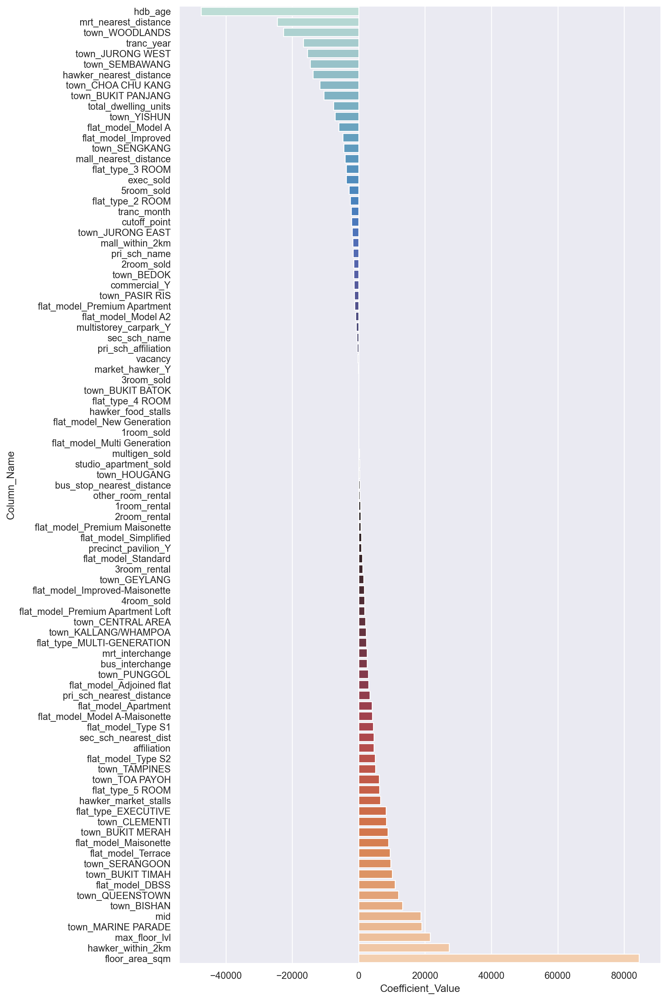

In [34]:
# Create df for storing coefficients and their corresponding variable names
coefficient_df = pd.DataFrame()

# Storing all the column names of predictors
coefficient_df['Column_Name'] = X_train.columns

# Store coefficients of predictors
coefficient_df['Coefficient_Value'] = pd.Series(optimal_lasso.coef_)

# Preview variables' coefficient values - The higher the values, the stronger the variables
with pd.option_context('display.max_rows', None):
    print(coefficient_df.sort_values(by='Coefficient_Value'))

# Plot the coefficent values
# Goal is to tune the model so that we get a more stable model i.e. similar size coefficient values
plt.rcParams['figure.figsize'] = (10,20)
sns.barplot(data=coefficient_df.sort_values(by='Coefficient_Value'), x='Coefficient_Value',y='Column_Name',orient='h',palette='icefire')
None

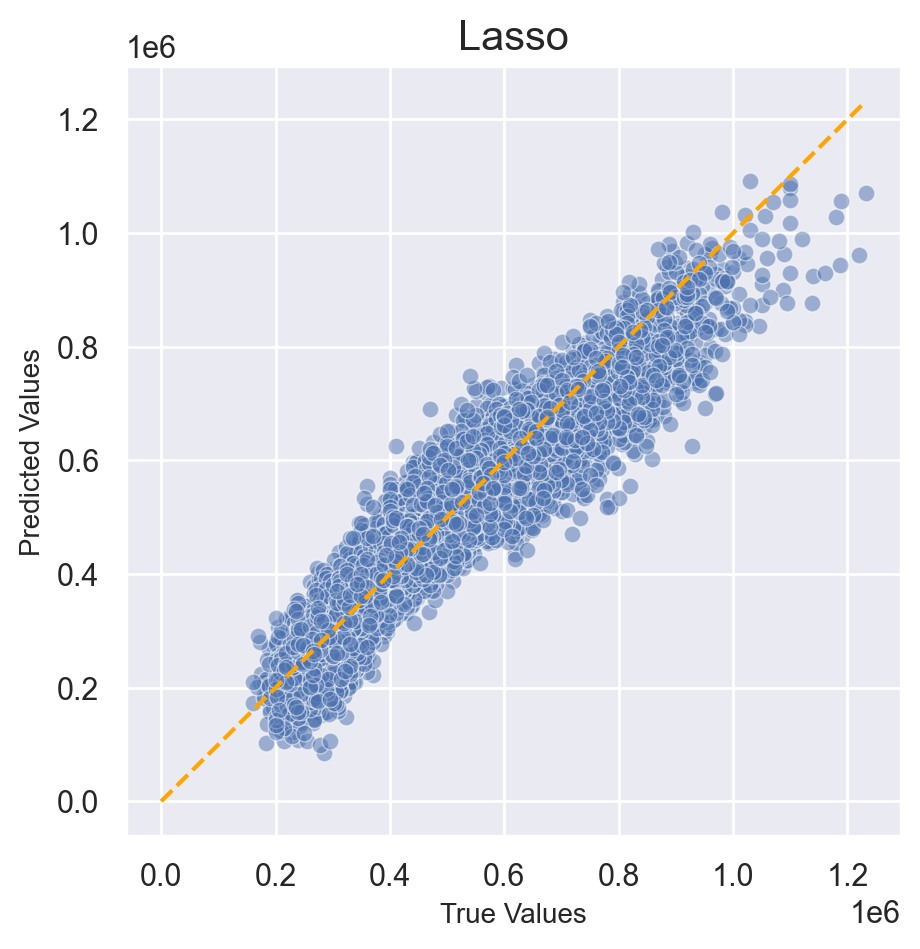

In [35]:
preds=optimal_lasso.predict(X_test_sc)
plt.figure(figsize = (5, 5))

sns.scatterplot(x=y_test, y=preds,alpha=0.5)
sns.set_theme()

# Line showing perfect predictions.
plt.plot([0, max(max(y_test),max(preds))],
         [0, max(max(y_test),max(preds))],
         linestyle = '--',color='orange')

plt.title('Lasso', fontsize = 15)
plt.xlabel('True Values', fontsize = 10)
plt.ylabel('Predicted Values', fontsize = 10);

### Dummify Variables

In [36]:
df_dummies=pd.get_dummies(train_clean_sel, drop_first=True)

### Select K Best

In [37]:
from sklearn.feature_selection import SelectKBest

X = df_dummies.drop('resale_price',axis=1)
y = train_clean['resale_price']

# for regression, we use these two
from sklearn.feature_selection import mutual_info_regression, f_regression

# this function will take in X, y variables 
# with criteria, and return a dataframe
# with most important columns
# based on that criteria
def featureSelect_dataframe(X, y, criteria, k):

    # initialize our function/method
    reg = SelectKBest(criteria, k=k).fit(X,y)
    
    # transform after creating the reg (so we can use getsupport)
    X_transformed = reg.transform(X)

    # filter down X based on kept columns
    X = X[reg.get_feature_names_out()]

    # return that dataframe
    return X

New_X = featureSelect_dataframe(X, y, mutual_info_regression, 20)

sel_k_best=New_X.columns.tolist()
sel_k_best

['floor_area_sqm',
 'hdb_age',
 'max_floor_lvl',
 'total_dwelling_units',
 '3room_sold',
 '4room_sold',
 '5room_sold',
 'exec_sold',
 'mall_nearest_distance',
 'hawker_nearest_distance',
 'hawker_food_stalls',
 'hawker_market_stalls',
 'mrt_nearest_distance',
 'bus_stop_nearest_distance',
 'pri_sch_nearest_distance',
 'vacancy',
 'sec_sch_nearest_dist',
 'cutoff_point',
 'flat_type_3 ROOM',
 'flat_type_5 ROOM']

In [38]:
# get all variables scores using select K Best  
reg = SelectKBest(mutual_info_regression, k='all').fit(X,y)
X_transformed = reg.transform(X) # not needed to get the score

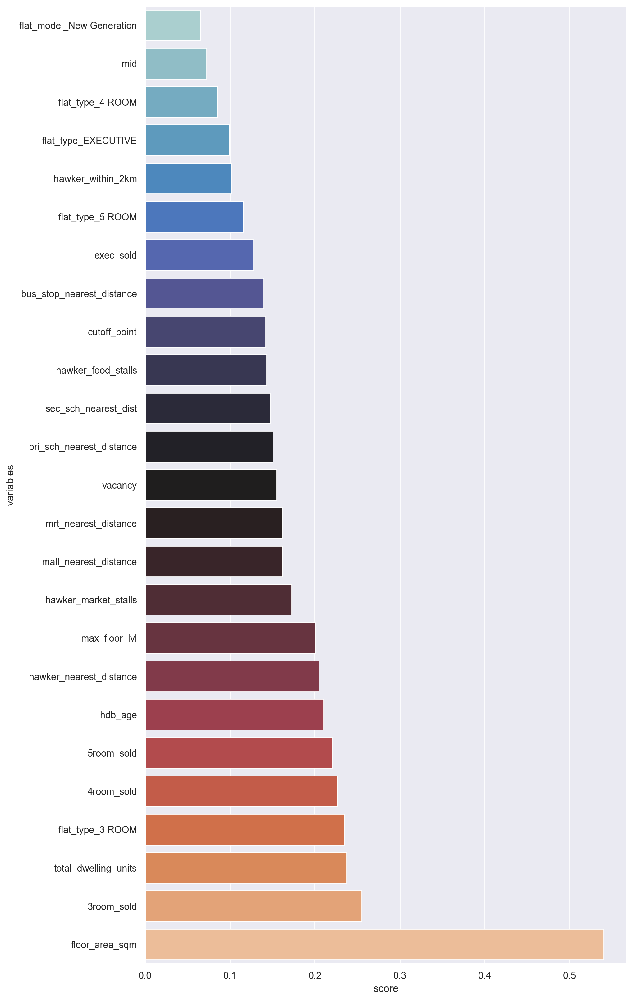

In [39]:
# stack 2 arrays together
nested_array=np.vstack([reg.feature_names_in_,reg.scores_])
# transpose array
nested_array=nested_array.T
# convert arrays to dataframe
selKbest_df=pd.DataFrame(nested_array)
selKbest_df=selKbest_df.rename(columns={0:'variables',1:'score'})
# filter top 25
selKbest_df=selKbest_df.sort_values(by='score', ascending=False).iloc[0:25,:]
# plot
sns.barplot(selKbest_df.sort_values(by='score'),x='score',y='variables',palette='icefire')
sns.set(rc={'figure.figsize':(15,10)})

In [40]:
coef_variables=coefficient_df[(coefficient_df['Coefficient_Value']<0) | (coefficient_df['Coefficient_Value']>0)]\
['Column_Name'].values.tolist()

In [41]:
# find common variables between Select K Best (top 20) and Lasso (more than 0 or less than 0)
common_variables=[]
for i in sel_k_best:
    if i in coef_variables:
        common_variables.append(i)
        
common_variables

['floor_area_sqm',
 'hdb_age',
 'max_floor_lvl',
 'total_dwelling_units',
 '4room_sold',
 '5room_sold',
 'exec_sold',
 'mall_nearest_distance',
 'hawker_nearest_distance',
 'hawker_market_stalls',
 'mrt_nearest_distance',
 'bus_stop_nearest_distance',
 'pri_sch_nearest_distance',
 'vacancy',
 'sec_sch_nearest_dist',
 'cutoff_point',
 'flat_type_3 ROOM',
 'flat_type_5 ROOM']

Second round of X variables selection is based on domain knowledge as well as common variables found between Select K Best (top 20) and Lasso (more than 0 or less than 0).

In [42]:
lst_sel_cols=['town', 'full_flat_type', 'floor_area_sqm',
       'tranc_year', 'mid', 'hdb_age', 'max_floor_lvl',
    'total_dwelling_units', 
    'mall_nearest_distance', 'resale_price',
       'hawker_nearest_distance', 'hawker_within_2km',
       'hawker_market_stalls', 'mrt_nearest_distance', 'bus_interchange',
       'pri_sch_nearest_distance', 'sec_sch_nearest_dist']